In [424]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import datajoint as dj
import pandas as pd
import ipyvolume as p3
import importlib
import re
from PIL import Image
import urllib
import json

import em2p_coreg

# must have dj-stor1 mounted and accessible from your Docker container

dj.config['external-stack'] = {'protocol': 'file','location': '/mnt/dj-stor01/pipeline-externals'} 

# datajoint schemas

plat = dj.create_virtual_module('pipeline_platinum','pipeline_platinum')
meso = dj.create_virtual_module('pipeline_meso', 'pipeline_meso')
reso = dj.create_virtual_module('pipeline_reso', 'pipeline_reso')
tune = dj.create_virtual_module('pipeline_tune', 'pipeline_tune')
stack = dj.create_virtual_module('pipeline_stack', 'pipeline_stack')
anatomy = dj.create_virtual_module('pipeline_anatomy', 'pipeline_anatomy')
radtune = dj.create_virtual_module('pipeline_radtune','pipeline_radtune')
spattune = dj.create_virtual_module('pipeline_spattune','pipeline_spattune')

INFO:datajoint.settings:Setting external-stack to {'protocol': 'file', 'location': '/mnt/dj-stor01/pipeline-externals'}
/usr/local/lib/python3.6/dist-packages/datajoint/connection.py:150: UserWarning: Mysql server has gone away. Reconnecting to the server.
  warnings.warn("Mysql server has gone away. Reconnecting to the server.")


In [13]:
from em2p_coreg import func
importlib.reload(func)

<module 'em2p_coreg.func' from '/src/em2p_coreg/python/em2p_coreg/func.py'>

In [431]:
from em2p_coreg import alignment
from em2p_coreg.alignment import solve_3d as s3
from em2p_coreg.alignment.transform import Transform, em_nm_to_voxels
import json
from em2p_coreg.links.make_ndviz_links import nglink1, example

# run transformation
args = s3.example2
args['model'] = 'TPS'    
s2 = s3.Solve3D(input_data=s3.example2, args=[])
s2.run()

t = Transform(model='TPS')
with open(s2.args['output_json'], 'r') as f:
    t.from_dict(json.load(f))

average residual [dst units]: 1608.7174


In [3]:
# 2P stack
stack_ch1, stack_ch2 = (stack.PreprocessedStack & {'animal_id': 17797, 'stack_idx': 19}).fetch('sharpened', order_by='channel')

In [5]:
# stack coordinates
x, y, z = np.meshgrid(np.arange(1412), np.arange(1322),np.arange(670), indexing='ij')
stack_grids = np.stack([x,y,z],-1)

In [18]:
# EM stack
resized = np.load('/mnt/scratch07/stelios/lowresEM/EM_at_1_um_per_px.npy')
EM_center = np.array([538560.0, 901280.41, 945454.55])[::-1] # had to flip it because I need it in x, y, z

In [355]:
cd /src/em2p_coreg/notebooks/images

/src/em2p_coreg/notebooks/images


Text(0.5, 1.0, 'vessel stack (red) and EM (gray) after "TPS" transformation, depth=150$\\mu$m')

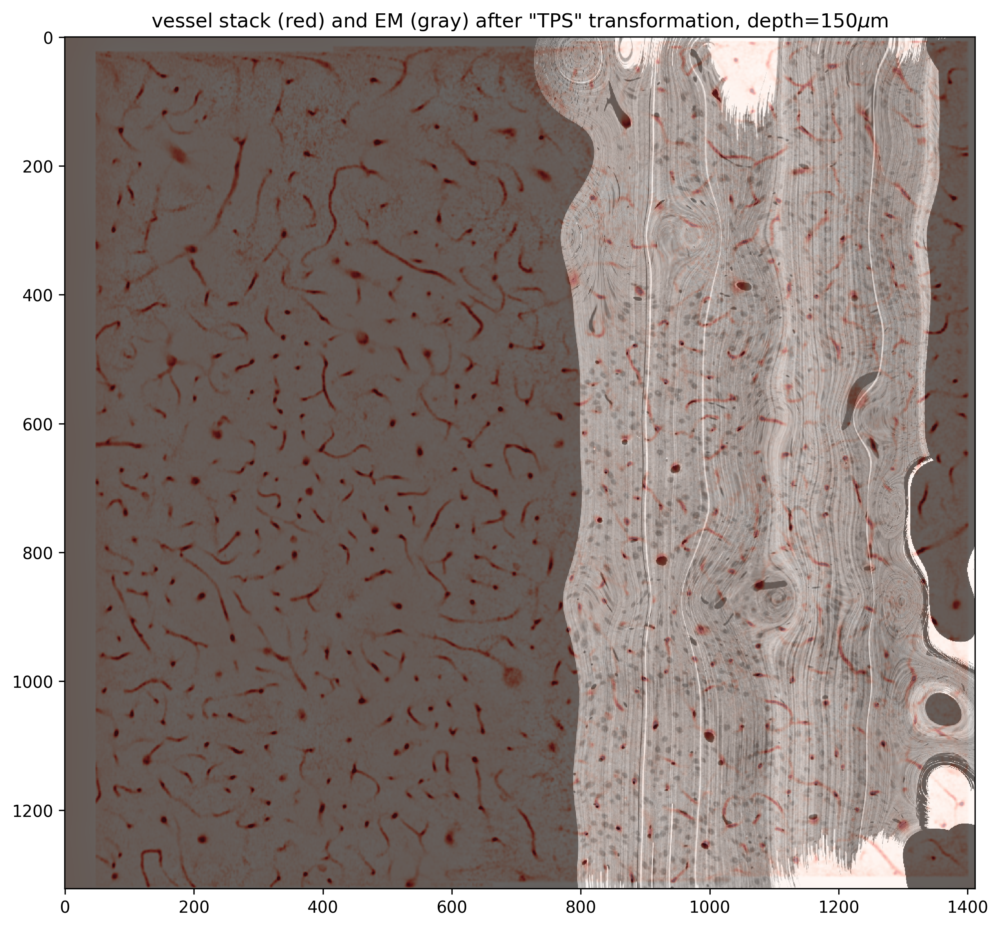

In [433]:
# for d in np.arange(150, 250, 50):
d = 150
# 2P data
grid_to_transform = stack_grids[:,:,d,:]
ch1_field = stack_ch1[d]
ch2_field = stack_ch2[d]

# EM data
EM_grid = func.uncoordinate(t.transform(func.coordinate(grid_to_transform)/1000),1412,1322)
temp_grid = (EM_grid - EM_center) / 1000
EM_field = func.sample_grid(resized, temp_grid).numpy()

l = 20
u = 200
brightened_EM_field = 255 * ((np.clip(EM_field.T, l, u) -l) / (u-l))

cell_overlay = (255* (ch1_field - ch1_field.min()) / ch1_field.ptp()).astype(np.uint8)
vessel_overlay = (255* (ch2_field - ch2_field.min()) / ch2_field.ptp()).astype(np.uint8)

fig, ax = plt.subplots(figsize=(10,10))
ax.imshow(vessel_overlay, cmap='Reds', alpha=0.9)
ax.imshow(brightened_EM_field, alpha=0.6, cmap='gray')
fig.set_dpi(300)
ax.set_title(f'vessel stack (red) and EM (gray) after "TPS" transformation, depth={d}$\mu$m')
#     fig.savefig(f'EM_2P_overlay_{d}')

#     blue_channel = np.zeros((1322,1412)).astype(np.uint8)
#     red_channel = (-cell_overlay).astype(np.uint8)
#     green_channel = (brightened_EM_field).astype(np.uint8)

#     combined = np.stack([red_channel, green_channel, blue_channel],-1)

#     fig, ax = plt.subplots(figsize=(10,10))
#     ax.imshow(combined)
#     fig.set_dpi(300)
#     ax.set_title(f'cell stack (red) depth={d}$\mu$m')

In [ ]:
blue_channel = np.zeros((1322,1412)).astype(np.uint8)
red_channel = (-cell_overlay).astype(np.uint8)
green_channel = (brightened_EM_field).astype(np.uint8)

combined = np.stack([red_channel, green_channel, blue_channel],-1)

fig, ax = plt.subplots(figsize=(10,10))
ax.imshow(combined)
fig.set_dpi(300)
ax.set_title(f'cell stack (red) depth={d}$\mu$m')

In [417]:
d=150
grid_to_transform = stack_grids[:,:,d,:]
ch1_field = stack_ch1[d]
ch2_field = stack_ch2[d]

# EM data
EM_grid = func.uncoordinate(t.transform(func.coordinate(grid_to_transform)/1000),1412,1322)
temp_grid = (EM_grid - EM_center) / 1000
EM_field = func.sample_grid(resized, temp_grid).numpy()

l = 20
u = 200
brightened_EM_field = 255 * ((np.clip(EM_field.T, l, u) -l) / (u-l))

cell_overlay = (255* (ch1_field - ch1_field.min()) / ch1_field.ptp()).astype(np.uint8)
vessel_overlay = (255* (ch2_field - ch2_field.min()) / ch2_field.ptp()).astype(np.uint8)


Text(0.5, 0.63, 'depth=150$\\mu$m')

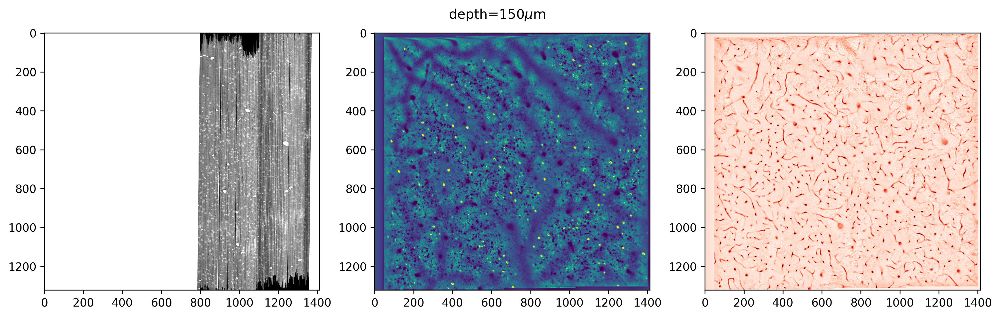

In [418]:
fig, axes = plt.subplots(1, 3, figsize=(15, 15), dpi=300)
axes[0].imshow(-brightened_EM_field, cmap='gray')
axes[1].imshow(ch1_field)
axes[2].imshow(ch2_field, cmap='Reds')
fig.suptitle(f'depth={d}$\mu$m', y=0.63)

# Archive

In [253]:
combined = np.zeros((1322, 1412, 3), dtype=np.uint8)
combined[:, :, 1] = (255* (ch1_field - ch1_field.min()) / ch1_field.ptp()).astype(np.uint8)
combined[:, :, 0] = (255* (ch2_field - ch2_field.min()) / ch2_field.ptp()).astype(np.uint8)
combined[:, :, 2] = (brightened_EM_field).astype(np.uint8)

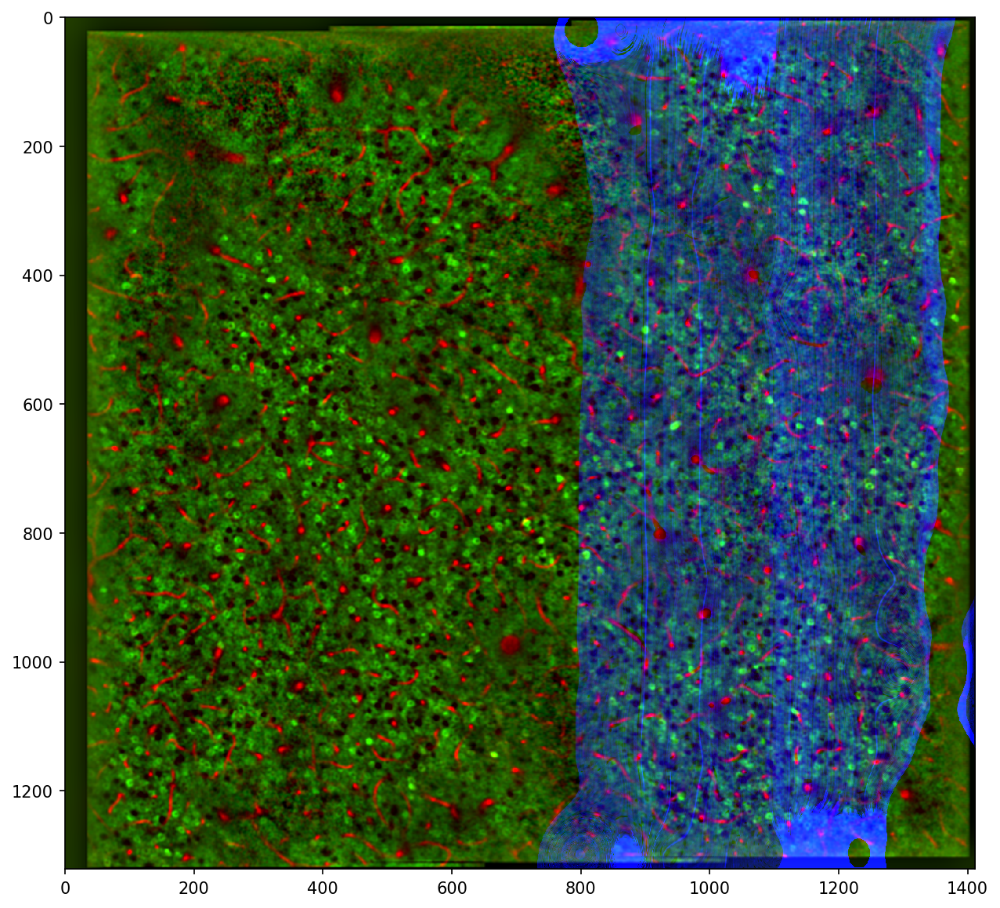

In [255]:
fig, ax = plt.subplots(figsize=(10,10), dpi=150)
ax.imshow(combined)
# ax.imshow(combined[:, :, 0])
# ax.imshow(combined[:, :, 1], alpha=0.3)
# ax.imshow(combined[:, :, 2], alpha=0.3)